# Object Detection API Demo

<table align="left"><td>
  <a target="_blank"  href="https://colab.sandbox.google.com/github/tensorflow/models/blob/master/research/object_detection/colab_tutorials/object_detection_tutorial.ipynb">
    <img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab
  </a>
</td><td>
  <a target="_blank"  href="https://github.com/tensorflow/models/blob/master/research/object_detection/colab_tutorials/object_detection_tutorial.ipynb">
    <img width=32px src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View source on GitHub</a>
</td></table>

Welcome to the [Object Detection API](https://github.com/tensorflow/models/tree/master/research/object_detection). This notebook will walk you step by step through the process of using a pre-trained model to detect objects in an image.

> **Important**: This tutorial is to help you through the first step towards using [Object Detection API](https://github.com/tensorflow/models/tree/master/research/object_detection) to build models. If you just just need an off the shelf model that does the job, see the [TFHub object detection example](https://colab.sandbox.google.com/github/tensorflow/hub/blob/master/examples/colab/object_detection.ipynb).

# Setup

Important: If you're running on a local machine, be sure to follow the [installation instructions](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2.md). This notebook includes only what's necessary to run in Colab.

### Install

In [2]:
%%bash
pwd
pip list

/tf/notebook
Package                      Version
---------------------------- ---------
absl-py                      1.0.0
argon2-cffi                  21.3.0
argon2-cffi-bindings         21.2.0
asttokens                    2.0.5
astunparse                   1.6.3
attrs                        21.4.0
backcall                     0.2.0
black                        22.1.0
bleach                       4.1.0
cachetools                   5.0.0
certifi                      2021.10.8
cffi                         1.15.0
charset-normalizer           2.0.11
click                        8.0.3
cycler                       0.11.0
debugpy                      1.5.1
decorator                    5.1.1
defusedxml                   0.7.1
entrypoints                  0.3
executing                    0.8.2
flatbuffers                  2.0
fonttools                    4.29.1
gast                         0.4.0
google-auth                  2.6.0
google-auth-oauthlib         0.4.6
google-pasta                

You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


In [3]:
%%bash
apt update 
# use midnight commander to explore the TF2 container..
apt install -y mc 
apt install -y protobuf-compiler

Hit:1 http://archive.ubuntu.com/ubuntu focal InRelease
Get:2 http://archive.ubuntu.com/ubuntu focal-updates InRelease [114 kB]
Get:3 http://archive.ubuntu.com/ubuntu focal-backports InRelease [108 kB]
Get:4 http://archive.ubuntu.com/ubuntu focal-updates/multiverse amd64 Packages [30.3 kB]
Get:5 http://archive.ubuntu.com/ubuntu focal-updates/universe amd64 Packages [1156 kB]
Get:6 http://archive.ubuntu.com/ubuntu focal-updates/main amd64 Packages [2241 kB]
Get:7 http://security.ubuntu.com/ubuntu focal-security InRelease [114 kB]
Get:8 http://archive.ubuntu.com/ubuntu focal-updates/restricted amd64 Packages [1252 kB]
Get:9 http://archive.ubuntu.com/ubuntu focal-backports/main amd64 Packages [51.2 kB]
Get:10 http://archive.ubuntu.com/ubuntu focal-backports/universe amd64 Packages [26.0 kB]
Get:11 http://security.ubuntu.com/ubuntu focal-security/multiverse amd64 Packages [25.8 kB]
Get:12 http://security.ubuntu.com/ubuntu focal-security/universe amd64 Packages [873 kB]
Get:13 http://securit

Reading package lists...
Building dependency tree...
Reading state information...
The following additional packages will be installed:
  libglib2.0-0 libglib2.0-data libgpm2 libicu66 libslang2 libssh2-1 libxml2
  mc-data shared-mime-info tzdata unzip xdg-user-dirs
Suggested packages:
  gpm arj catdvi | texlive-binaries dbview djvulibre-bin epub-utils
  genisoimage gv imagemagick libaspell-dev links | w3m | lynx odt2txt
  poppler-utils python python-boto python-tz xpdf | pdf-viewer zip
The following NEW packages will be installed:
  libglib2.0-0 libglib2.0-data libgpm2 libicu66 libslang2 libssh2-1 libxml2 mc
  mc-data shared-mime-info tzdata unzip xdg-user-dirs
0 upgraded, 13 newly installed, 0 to remove and 52 not upgraded.
Need to get 13.7 MB of archives.
After this operation, 57.3 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu focal-updates/main amd64 libglib2.0-0 amd64 2.64.6-1~ubuntu20.04.4 [1287 kB]
Get:2 http://archive.ubuntu.com/ubuntu focal-upd

debconf: delaying package configuration, since apt-utils is not installed


Fetched 13.7 MB in 1s (9908 kB/s)
Selecting previously unselected package libglib2.0-0:amd64.
(Reading database ... 15420 files and directories currently installed.)
Preparing to unpack .../00-libglib2.0-0_2.64.6-1~ubuntu20.04.4_amd64.deb ...
Unpacking libglib2.0-0:amd64 (2.64.6-1~ubuntu20.04.4) ...
Selecting previously unselected package libglib2.0-data.
Preparing to unpack .../01-libglib2.0-data_2.64.6-1~ubuntu20.04.4_all.deb ...
Unpacking libglib2.0-data (2.64.6-1~ubuntu20.04.4) ...
Selecting previously unselected package tzdata.
Preparing to unpack .../02-tzdata_2022a-0ubuntu0.20.04_all.deb ...
Unpacking tzdata (2022a-0ubuntu0.20.04) ...
Selecting previously unselected package libicu66:amd64.
Preparing to unpack .../03-libicu66_66.1-2ubuntu2.1_amd64.deb ...
Unpacking libicu66:amd64 (66.1-2ubuntu2.1) ...
Selecting previously unselected package libslang2:amd64.
Preparing to unpack .../04-libslang2_2.3.2-4_amd64.deb ...
Unpacking libslang2:amd64 (2.3.2-4) ...
Selecting previously unse

Reading package lists...
Building dependency tree...
Reading state information...
The following additional packages will be installed:
  libprotobuf-dev libprotobuf-lite17 libprotobuf17 libprotoc17
The following NEW packages will be installed:
  libprotobuf-dev libprotobuf-lite17 libprotobuf17 libprotoc17
  protobuf-compiler
0 upgraded, 5 newly installed, 0 to remove and 52 not upgraded.
Need to get 2758 kB of archives.
After this operation, 16.9 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu focal/main amd64 libprotobuf-lite17 amd64 3.6.1.3-2ubuntu5 [132 kB]
Get:2 http://archive.ubuntu.com/ubuntu focal/main amd64 libprotobuf17 amd64 3.6.1.3-2ubuntu5 [798 kB]
Get:3 http://archive.ubuntu.com/ubuntu focal/main amd64 libprotoc17 amd64 3.6.1.3-2ubuntu5 [646 kB]
Get:4 http://archive.ubuntu.com/ubuntu focal/main amd64 libprotobuf-dev amd64 3.6.1.3-2ubuntu5 [1155 kB]
Get:5 http://archive.ubuntu.com/ubuntu focal/universe amd64 protobuf-compiler amd64 3.6.1.3-2

debconf: delaying package configuration, since apt-utils is not installed


Fetched 2758 kB in 1s (2044 kB/s)
Selecting previously unselected package libprotobuf-lite17:amd64.
(Reading database ... 18136 files and directories currently installed.)
Preparing to unpack .../libprotobuf-lite17_3.6.1.3-2ubuntu5_amd64.deb ...
Unpacking libprotobuf-lite17:amd64 (3.6.1.3-2ubuntu5) ...
Selecting previously unselected package libprotobuf17:amd64.
Preparing to unpack .../libprotobuf17_3.6.1.3-2ubuntu5_amd64.deb ...
Unpacking libprotobuf17:amd64 (3.6.1.3-2ubuntu5) ...
Selecting previously unselected package libprotoc17:amd64.
Preparing to unpack .../libprotoc17_3.6.1.3-2ubuntu5_amd64.deb ...
Unpacking libprotoc17:amd64 (3.6.1.3-2ubuntu5) ...
Selecting previously unselected package libprotobuf-dev:amd64.
Preparing to unpack .../libprotobuf-dev_3.6.1.3-2ubuntu5_amd64.deb ...
Unpacking libprotobuf-dev:amd64 (3.6.1.3-2ubuntu5) ...
Selecting previously unselected package protobuf-compiler.
Preparing to unpack .../protobuf-compiler_3.6.1.3-2ubuntu5_amd64.deb ...
Unpacking proto

In [4]:
# !pip install -U --pre tensorflow=="2.*"
# !pip install tf_slim

Make sure you have `pycocotools` installed

In [8]:
import os
import pathlib

if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
# elif not pathlib.Path('models').exists():
!git clone --depth 1 https://github.com/tensorflow/models

fatal: destination path 'models' already exists and is not an empty directory.


In [10]:
%%bash
# pip install tf_slim scipy tensorflow_io pyyaml
pip install pycocotools
# testing that is downgrades all packages per the requirements.txt.  !pip install --upgrade keras
# pip install -r requirements.txt

  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
    Preparing wheel metadata: started
    Preparing wheel metadata: finished with status 'done'
  Created wheel for pycocotools: filename=pycocotools-2.0.4-cp38-cp38-linux_x86_64.whl size=418763 sha256=e786a60539eeaa63ae6866fd687bbfe32a450d3c85a23e9cd068c0681777a352
  Stored in directory: /root/.cache/pip/wheels/dd/e2/43/3e93cd653b3346b3d702bb0509bc611189f95d60407bff1484
Successfully built pycocotools


You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


Get `tensorflow/models` or `cd` to parent directory of the repository.

Compile protobufs and install the object_detection package

In [11]:
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.

In [19]:
%%bash 
cd models/research
pwd

cp object_detection/packages/tf2/setup.py .
#pip install . --upgrade
# what does "pip install ." do? I think it runs setup.py in dot folder.

#try without this..
python -m pip install --use-feature=2020-resolver .

/tf/notebook/models/research
Processing /tf/notebook/models/research
  Using cached avro-python3-1.10.2.tar.gz (38 kB)
  Using cached apache_beam-2.38.0-cp38-cp38-manylinux2010_x86_64.whl (12.1 MB)
  Using cached lxml-4.8.0-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.manylinux_2_24_x86_64.whl (6.9 MB)
  Using cached Cython-0.29.29-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.manylinux_2_24_x86_64.whl (1.9 MB)
  Using cached contextlib2-21.6.0-py2.py3-none-any.whl (13 kB)
  Using cached lvis-0.5.3-py3-none-any.whl (14 kB)
  Using cached hdfs-2.7.0-py3-none-any.whl (34 kB)
  Using cached cloudpickle-2.0.0-py3-none-any.whl (25 kB)
  Using cached fastavro-1.4.11-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (2.6 MB)
  Using cached oauth2client-4.1.3-py2.py3-none-any.whl (98 kB)


  Using cached httplib2-0.19.1-py3-none-any.whl (95 kB)
  Using cached dill-0.3.1.1.tar.gz (151 kB)
  Using cached crcmod-1.7.tar.gz (89 kB)
  Using cached keras-2.8.0-py2.py3-none-any.whl (1.4 MB)


  Using cached google_api_python_client-2.47.0-py2.py3-none-any.whl (8.4 MB)
  Using cached kaggle-1.5.12.tar.gz (58 kB)
  Using cached gin_config-0.5.0-py3-none-any.whl (61 kB)
  Using cached docopt-0.6.2.tar.gz (25 kB)
  Using cached dm_tree-0.1.7-cp38-cp38-manylinux_2_12_x86_64.manylinux2010_x86_64.whl (142 kB)
  Using cached colorama-0.4.4-py2.py3-none-any.whl (16 kB)
  Using cached google_auth_httplib2-0.1.0-py2.py3-none-any.whl (9.3 kB)
  Using cached google_api_core-2.7.3-py3-none-any.whl (114 kB)


  Using cached joblib-1.1.0-py2.py3-none-any.whl (306 kB)
  Using cached googleapis_common_protos-1.56.1-py2.py3-none-any.whl (211 kB)
  Created wheel for object-detection: filename=object_detection-0.1-py3-none-any.whl size=1692781 sha256=f8ab4dd8428b8266b207d84ae560a23e9c4a97d836b602fdc3da58c9f4adaa4a
  Stored in directory: /tmp/pip-ephem-wheel-cache-jz7fy_7p/wheels/96/3b/d0/d66f5cd38152b2c7089dec3325147fe77e18b7ac39b1516c10
  Created wheel for avro-python3: filename=avro_python3-1.10.2-py3-none-any.whl size=44009 sha256=76ede5b268e5c0d447146035f6d8a79cb30924703ba8d0894fe2137d85e9ed2c
  Stored in directory: /root/.cache/pip/wheels/bb/73/e9/d273421f5723c4bf544dcf9eb097bda94421ef8d3252699f0a
  Created wheel for dill: filename=dill-0.3.1.1-py3-none-any.whl size=78545 sha256=46dee0e7741079d1936b429031823e2d3c397926f7e13b79bf3a1660f03043af
  Stored in directory: /root/.cache/pip/wheels/07/35/78/e9004fa30578734db7f10e7a211605f3f0778d2bdde38a239d
  Created wheel for crcmod: filename=crcmod-

ERROR: tensorflow-cpu 2.7.1 requires keras<2.8,>=2.7.0rc0, but you'll have keras 2.8.0 which is incompatible.
tensorflow-cpu 2.7.1 requires tensorflow-estimator<2.8,~=2.7.0rc0, but you'll have tensorflow-estimator 2.8.0 which is incompatible.


You should consider upgrading via the '/usr/local/bin/python -m pip install --upgrade pip' command.


In [ ]:
# pip install tf_slim scipy tensorflow_io pyyaml
# pip install pycocotools
# testing that is downgrades all packages per the requirements.txt.  !pip install --upgrade keras

In [20]:
%%bash
cd /tf/notebook
pip install -r /tf/notebook/requirements.txt

  Using cached Cython-0.29.28-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.manylinux_2_24_x86_64.whl (1.9 MB)


  Attempting uninstall: Cython
    Found existing installation: Cython 0.29.29
    Uninstalling Cython-0.29.29:
      Successfully uninstalled Cython-0.29.29
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.8.1
    Uninstalling tensorflow-2.8.1:
      Successfully uninstalled tensorflow-2.8.1
  Attempting uninstall: tensorflow-estimator
    Found existing installation: tensorflow-estimator 2.8.0
    Uninstalling tensorflow-estimator-2.8.0:
      Successfully uninstalled tensorflow-estimator-2.8.0


ERROR: After October 2020 you may experience errors when installing or updating packages. This is because pip will change the way that it resolves dependency conflicts.

We recommend you use --use-feature=2020-resolver to test your packages with the new resolver before it becomes the default.

tensorflow-cpu 2.7.1 requires keras<2.8,>=2.7.0rc0, but you'll have keras 2.8.0 which is incompatible.


You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


In [21]:
%%bash
echo fixing above.
#python -m pip uninstall -y tensorflow keras pyparsing

fixing above.


In [22]:
# %%bash
# trying to fix things..
# python -m pip install tensorflow keras pyparsing

In [23]:
# %%bash
# pip install pyparsing==2.4.2
# pip install httplib2==0.20.2

### Imports

In [24]:
%%bash
pwd
pip list

/tf/notebook
Package                       Version
----------------------------- -------------------
absl-py                       1.0.0
apache-beam                   2.38.0
argon2-cffi                   21.3.0
argon2-cffi-bindings          21.2.0
asttokens                     2.0.5
astunparse                    1.6.3
attrs                         21.4.0
avro-python3                  1.10.2
backcall                      0.2.0
black                         22.1.0
bleach                        4.1.0
cachetools                    5.0.0
certifi                       2021.10.8
cffi                          1.15.0
charset-normalizer            2.0.11
click                         8.0.3
cloudpickle                   2.0.0
colorama                      0.4.4
contextlib2                   21.6.0
crcmod                        1.7
cycler                        0.11.0
Cython                        0.29.28
debugpy                       1.5.1
decorator                     5.1.1
defusedxml           

You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


In [25]:
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image
from IPython.display import display

Import the object detection module.

In [26]:
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

Patches:

In [27]:
# patch tf1 into `utils.ops`
utils_ops.tf = tf.compat.v1

# Patch the location of gfile
tf.gfile = tf.io.gfile

# Model preparation 

## Variables

Any model exported using the `export_inference_graph.py` tool can be loaded here simply by changing the path.

By default we use an "SSD with Mobilenet" model here. See the [detection model zoo](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/detection_model_zoo.md) for a list of other models that can be run out-of-the-box with varying speeds and accuracies.

## Loader

In [28]:
def load_model(model_name):
  base_url = 'http://download.tensorflow.org/models/object_detection/'
  model_file = model_name + '.tar.gz'
  model_dir = tf.keras.utils.get_file(
    fname=model_name, 
    origin=base_url + model_file,
    untar=True)

  model_dir = pathlib.Path(model_dir)/"saved_model"

  model = tf.saved_model.load(str(model_dir))

  return model

## Loading label map
Label maps map indices to category names, so that when our convolution network predicts `5`, we know that this corresponds to `airplane`.  Here we use internal utility functions, but anything that returns a dictionary mapping integers to appropriate string labels would be fine

In [29]:
# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = 'models/research/object_detection/data/mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

For the sake of simplicity we will test on 2 images:

In [30]:
# If you want to test the code with your images, just add path to the images to the TEST_IMAGE_PATHS.
import pathlib
PATH_TO_TEST_IMAGES_DIR = pathlib.Path('models/research/object_detection/test_images')
TEST_IMAGE_PATHS = sorted(list(PATH_TO_TEST_IMAGES_DIR.glob("*.jpg")))
TEST_IMAGE_PATHS

[PosixPath('models/research/object_detection/test_images/image1.jpg'),
 PosixPath('models/research/object_detection/test_images/image2.jpg'),
 PosixPath('models/research/object_detection/test_images/image3.jpg')]

# Detection

Load an object detection model:

In [31]:
model_name = 'ssd_mobilenet_v1_coco_2017_11_17'
detection_model = load_model(model_name)

76546048/76534733 [==============================] - 12s 0us/step
INFO:tensorflow:Saver not created because there are no variables in the graph to restore


Check the model's input signature, it expects a batch of 3-color images of type uint8:

In [32]:
print(detection_model.signatures['serving_default'].inputs)

[<tf.Tensor 'image_tensor:0' shape=(None, None, None, 3) dtype=uint8>]


And returns several outputs:

In [33]:
detection_model.signatures['serving_default'].output_dtypes

{'detection_boxes': tf.float32,
 'detection_classes': tf.float32,
 'num_detections': tf.float32,
 'detection_scores': tf.float32}

In [34]:
detection_model.signatures['serving_default'].output_shapes

{'detection_boxes': TensorShape([None, 100, 4]),
 'detection_classes': TensorShape([None, 100]),
 'num_detections': TensorShape([None]),
 'detection_scores': TensorShape([None, 100])}

Add a wrapper function to call the model, and cleanup the outputs:

In [35]:
def run_inference_for_single_image(model, image):
  image = np.asarray(image)
  # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
  input_tensor = tf.convert_to_tensor(image)
  # The model expects a batch of images, so add an axis with `tf.newaxis`.
  input_tensor = input_tensor[tf.newaxis,...]

  # Run inference
  model_fn = model.signatures['serving_default']
  output_dict = model_fn(input_tensor)

  # All outputs are batches tensors.
  # Convert to numpy arrays, and take index [0] to remove the batch dimension.
  # We're only interested in the first num_detections.
  num_detections = int(output_dict.pop('num_detections'))
  output_dict = {key:value[0, :num_detections].numpy() 
                 for key,value in output_dict.items()}
  output_dict['num_detections'] = num_detections

  # detection_classes should be ints.
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)
   
  # Handle models with masks:
  if 'detection_masks' in output_dict:
    # Reframe the the bbox mask to the image size.
    detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
              output_dict['detection_masks'], output_dict['detection_boxes'],
               image.shape[0], image.shape[1])      
    detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                       tf.uint8)
    output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()
    
  return output_dict

Run it on each test image and show the results:

In [36]:
def show_inference(model, image_path):
  # the array based representation of the image will be used later in order to prepare the
  # result image with boxes and labels on it.
  image_np = np.array(Image.open(image_path))
  # Actual detection.
  output_dict = run_inference_for_single_image(model, image_np)
  # Visualization of the results of a detection.
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=8)

  display(Image.fromarray(image_np))

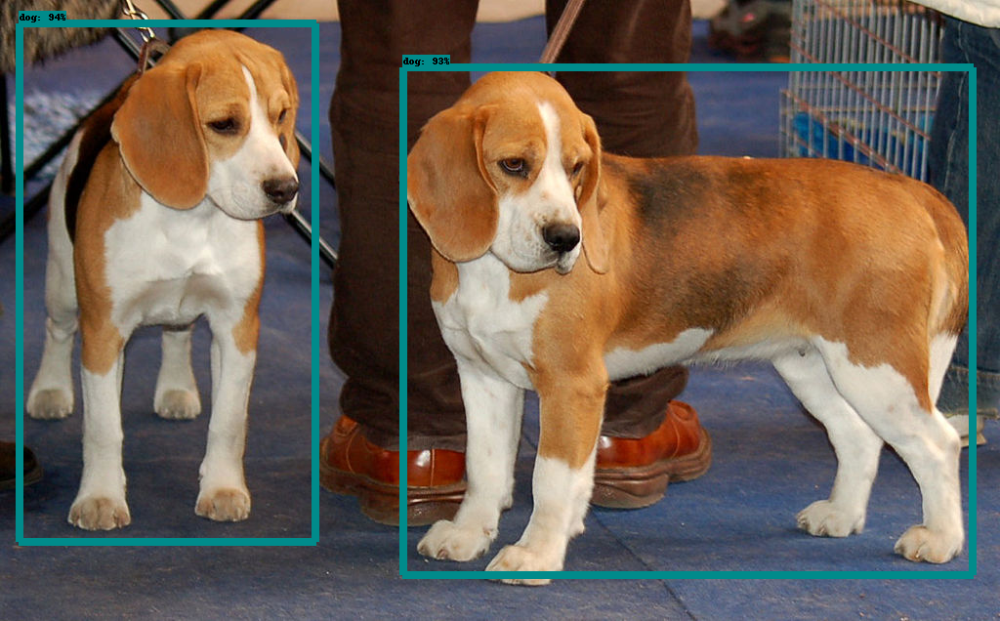

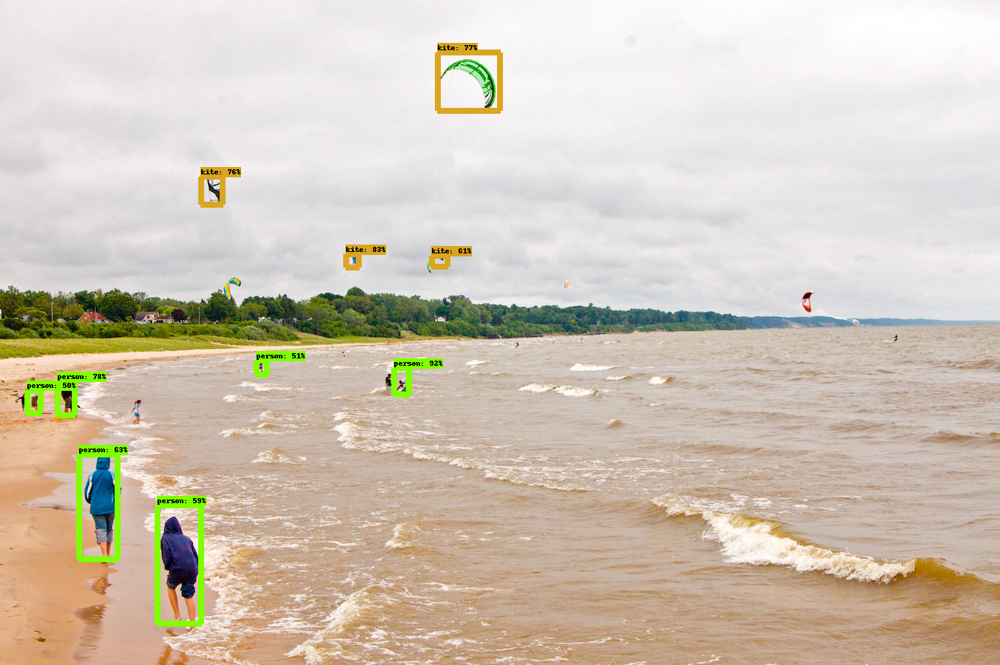

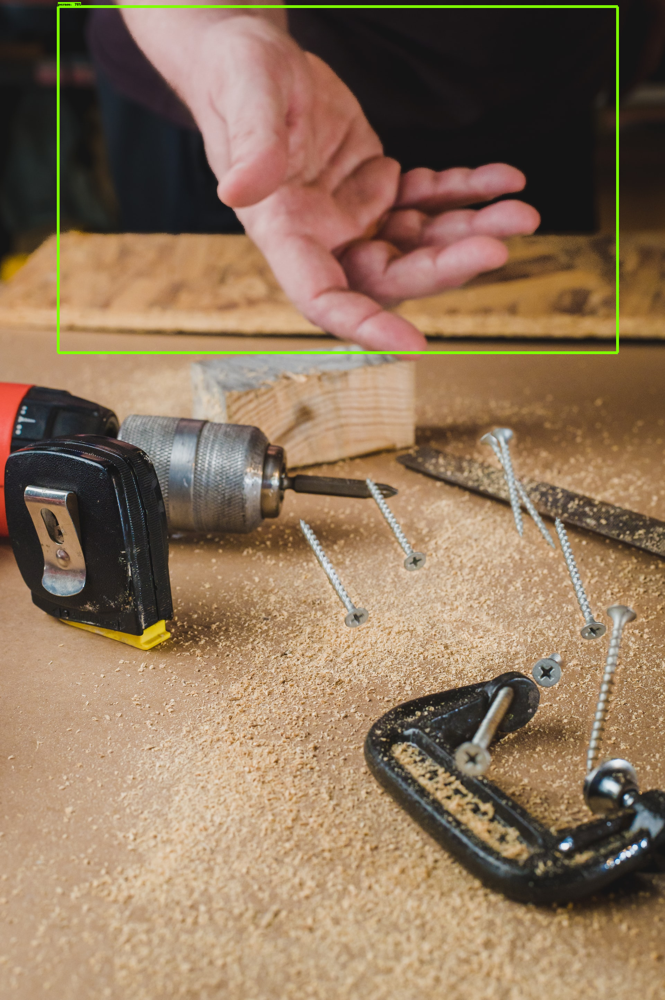

In [37]:
# show detected bounding boxes on each image..
for image_path in TEST_IMAGE_PATHS:
  show_inference(detection_model, image_path)


## Instance Segmentation

In [38]:
# model_name = "mask_rcnn_inception_resnet_v2_atrous_coco_2018_01_28"
# masking_model = load_model(model_name)

The instance segmentation model includes a `detection_masks` output:

In [39]:
# was.. masking_model.output_shapes
# masking_model.signatures['serving_default'].output_shapes

In [40]:
# for image_path in TEST_IMAGE_PATHS:
#   show_inference(masking_model, image_path)

In [41]:
%%bash
cd models/research;
pwd;
echo "before:${PYTHONPATH}";
export PYTHONPATH=${PYTHONPATH}:/tf/notebook/models:/tf/notebook/models/research
echo "after:${PYTHONPATH}";
python object_detection/builders/model_builder_tf2_test.py

/tf/notebook/models/research
before:
after::/tf/notebook/models:/tf/notebook/models/research


2022-05-16 21:55:18.947348: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-05-16 21:55:18.947424: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-05-16 21:55:25.377647: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2022-05-16 21:55:25.378080: W tensorflow/stream_executor/cuda/cuda_driver.cc:269] failed call to cuInit: UNKNOWN ERROR (303)
2022-05-16 21:55:25.378135: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (81d42616f227): /proc/driver/nvidia/version does not exist
Running tests under Python 3.8.10: /usr/local/bin/python
[ RUN  

I0516 21:55:37.446224 140304351307584 efficientnet_model.py:143] round_filter input=32 output=32
I0516 21:55:37.477529 140304351307584 efficientnet_model.py:143] round_filter input=32 output=32
I0516 21:55:37.477797 140304351307584 efficientnet_model.py:143] round_filter input=16 output=16
I0516 21:55:37.585213 140304351307584 efficientnet_model.py:143] round_filter input=16 output=16
I0516 21:55:37.585449 140304351307584 efficientnet_model.py:143] round_filter input=24 output=24
I0516 21:55:37.860390 140304351307584 efficientnet_model.py:143] round_filter input=24 output=24
I0516 21:55:37.860639 140304351307584 efficientnet_model.py:143] round_filter input=40 output=40
I0516 21:55:38.140322 140304351307584 efficientnet_model.py:143] round_filter input=40 output=40
I0516 21:55:38.140560 140304351307584 efficientnet_model.py:143] round_filter input=80 output=80
I0516 21:55:39.037319 140304351307584 efficientnet_model.py:143] round_filter input=80 output=80
I0516 21:55:39.037797 14030435

I0516 21:55:51.160429 140304351307584 efficientnet_model.py:143] round_filter input=40 output=48
I0516 21:55:51.160678 140304351307584 efficientnet_model.py:143] round_filter input=80 output=88
I0516 21:55:51.803409 140304351307584 efficientnet_model.py:143] round_filter input=80 output=88
I0516 21:55:51.803662 140304351307584 efficientnet_model.py:143] round_filter input=112 output=120
I0516 21:55:52.556117 140304351307584 efficientnet_model.py:143] round_filter input=112 output=120
I0516 21:55:52.556374 140304351307584 efficientnet_model.py:143] round_filter input=192 output=208
I0516 21:55:53.627725 140304351307584 efficientnet_model.py:143] round_filter input=192 output=208
I0516 21:55:53.628118 140304351307584 efficientnet_model.py:143] round_filter input=320 output=352
I0516 21:55:54.175149 140304351307584 efficientnet_model.py:143] round_filter input=1280 output=1408
I0516 21:55:54.328830 140304351307584 efficientnet_model.py:453] Building model efficientnet with params ModelCon

I0516 21:56:10.276805 140304351307584 efficientnet_model.py:143] round_filter input=320 output=448
I0516 21:56:11.097775 140304351307584 efficientnet_model.py:143] round_filter input=1280 output=1792
I0516 21:56:11.241550 140304351307584 efficientnet_model.py:453] Building model efficientnet with params ModelConfig(width_coefficient=1.4, depth_coefficient=1.8, resolution=380, dropout_rate=0.4, blocks=(BlockConfig(input_filters=32, output_filters=16, kernel_size=3, num_repeat=1, expand_ratio=1, strides=(1, 1), se_ratio=0.25, id_skip=True, fused_conv=False, conv_type='depthwise'), BlockConfig(input_filters=16, output_filters=24, kernel_size=3, num_repeat=2, expand_ratio=6, strides=(2, 2), se_ratio=0.25, id_skip=True, fused_conv=False, conv_type='depthwise'), BlockConfig(input_filters=24, output_filters=40, kernel_size=5, num_repeat=2, expand_ratio=6, strides=(2, 2), se_ratio=0.25, id_skip=True, fused_conv=False, conv_type='depthwise'), BlockConfig(input_filters=40, output_filters=80, ker

I0516 21:56:36.455525 140304351307584 ssd_efficientnet_bifpn_feature_extractor.py:145] EfficientDet EfficientNet backbone version: efficientnet-b7
I0516 21:56:36.455938 140304351307584 ssd_efficientnet_bifpn_feature_extractor.py:147] EfficientDet BiFPN num filters: 384
I0516 21:56:36.456164 140304351307584 ssd_efficientnet_bifpn_feature_extractor.py:148] EfficientDet BiFPN num iterations: 8
I0516 21:56:36.462676 140304351307584 efficientnet_model.py:143] round_filter input=32 output=64
I0516 21:56:36.523855 140304351307584 efficientnet_model.py:143] round_filter input=32 output=64
I0516 21:56:36.524301 140304351307584 efficientnet_model.py:143] round_filter input=16 output=32
I0516 21:56:37.088514 140304351307584 efficientnet_model.py:143] round_filter input=16 output=32
I0516 21:56:37.088857 140304351307584 efficientnet_model.py:143] round_filter input=24 output=48
I0516 21:56:38.627115 140304351307584 efficientnet_model.py:143] round_filter input=24 output=48
I0516 21:56:38.627362 14

In [42]:
!pwd
!pip list
!pip freeze>requirements_$(date +"_%Y.%m.%d_%b-%a_%H.%M.%S").txt
!ls

/tf/notebook
Package                       Version
----------------------------- -------------------
absl-py                       1.0.0
apache-beam                   2.38.0
argon2-cffi                   21.3.0
argon2-cffi-bindings          21.2.0
asttokens                     2.0.5
astunparse                    1.6.3
attrs                         21.4.0
avro-python3                  1.10.2
backcall                      0.2.0
black                         22.1.0
bleach                        4.1.0
cachetools                    5.0.0
certifi                       2021.10.8
cffi                          1.15.0
charset-normalizer            2.0.11
click                         8.0.3
cloudpickle                   2.0.0
colorama                      0.4.4
contextlib2                   21.6.0
crcmod                        1.7
cycler                        0.11.0
Cython                        0.29.28
debugpy                       1.5.1
decorator                     5.1.1
defusedxml           


# Notes
cd /tf/notebook/models/research
